# **Develop Model Xception**

In [1]:
# !rm -rf /kaggle/working/*

In [2]:
# Common imports
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from typing import Tuple, List
import seaborn as sns

# Data Imports
import pandas as pd
from tqdm import tqdm
from glob import glob
from tensorflow import data as tfd
from tensorflow import image as tfi

# Data Visualization
import plotly.express as px
import matplotlib.pyplot as plt
import os
from IPython.display import clear_output as cls

In [3]:
# Model Architecture
from tensorflow.keras import Sequential
from tensorflow.keras.applications import Xception
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense
from tensorflow.keras.preprocessing import image

# Model Training
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report
# Model Hypertunning
!pip install -q keras_tuner
import keras_tuner as kt
cls()

In [4]:
# Daftar semua makanan
makanan = ["Ayam Goreng", "Burger", "French Fries", "Gado-Gado", "Ikan Goreng",
            "Nasi Goreng", "Nasi Padang", "Mie Goreng", "Pizza", "Rawon",
            "Rendang", "Sate", "Soto"
]
dataset_dir = '/kaggle/input/dataset-food-classification/dataset_gambar'

print('Number of images:')

for makanan_item in makanan:
    makanan_path = os.path.join(dataset_dir, makanan_item)
    if os.path.isdir(makanan_path): # Periksa apakah folder ada
        # Gunakan os.listdir untuk menghitung jumlah file di dalam folder
        image_files = [f for f in os.listdir(makanan_path) if os.path.isfile(os.path.join(makanan_path, f))]
        print(f'{makanan_item}: {len(image_files)}')
    else:
        print(f'Folder {makanan_item} tidak ditemukan.')

Number of images:
Ayam Goreng: 500
Burger: 500
French Fries: 500
Gado-Gado: 500
Ikan Goreng: 500
Nasi Goreng: 500
Nasi Padang: 500
Mie Goreng: 500
Pizza: 500
Rawon: 500
Rendang: 500
Sate: 500
Soto: 500


In [5]:
import os
from glob import glob

print('Number of valid images')
categories = os.listdir('/kaggle/input/dataset-food-classification/dataset_gambar')

for cat in categories:
    # Gunakan glob.glob() untuk mendapatkan daftar file
    files = glob(f'/content/dataset_gambar/{cat}/*')
    print(f'{cat}: {len(files)}')

Number of valid images
Sate: 0
Gado-Gado: 0
Burger: 0
Ayam Goreng: 0
Rawon: 0
French Fries: 0
Nasi Padang: 0
Rendang: 0
Nasi Goreng: 0
Ikan Goreng: 0
Soto: 0
Pizza: 0
Mie Goreng: 0


In [6]:
def show_images(category, size=10):
    # Path of all image in category directory (train/test)
    img_path = glob(f'/kaggle/input/dataset-food-classification/dataset_gambar/{category}/*')  # Corrected path

    # Shuffle the paths
    np.random.shuffle(img_path)

    # Plot images
    nrows = 2
    ncols = size // nrows  # Divide the size by the number of rows for columns

    # Create figure with specified size
    fig = plt.figure(figsize=(15, 10))

    # Plot the first 'size' images
    for idx in range(size):
        ax = fig.add_subplot(nrows, ncols, idx+1, xticks=[], yticks=[])
        image = plt.imread(img_path[idx])
        ax.imshow(image)

    # Show the plot
    plt.show()

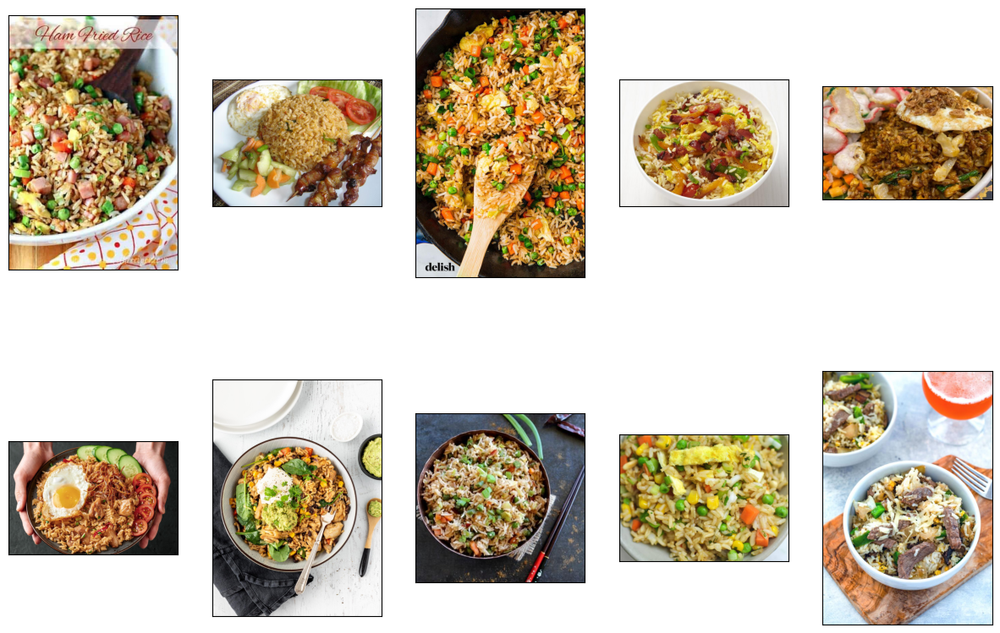

In [7]:
show_images('Nasi Goreng', size=10)

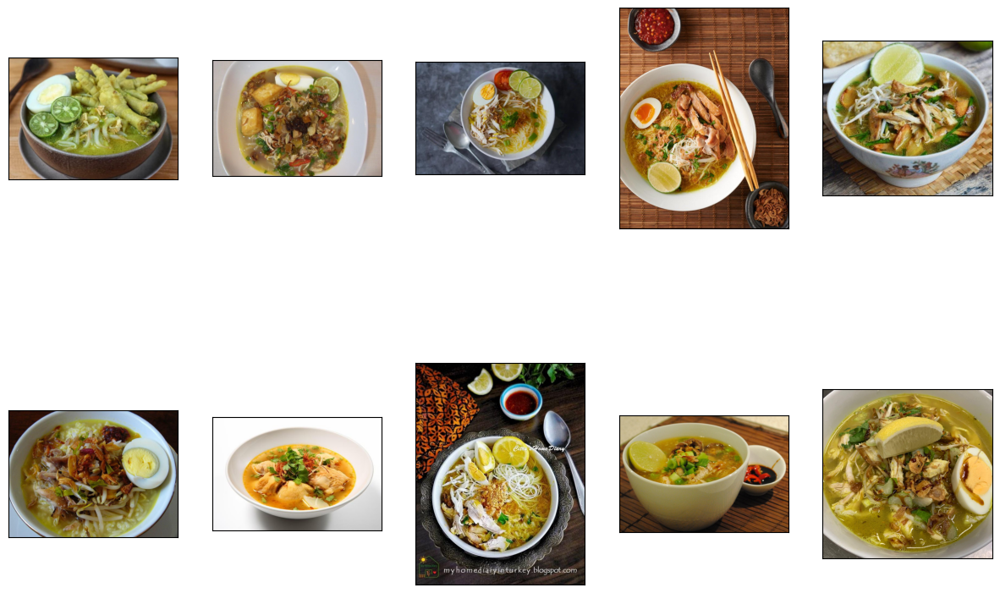

In [8]:
show_images('Soto')

In [9]:
import shutil
def split_data(source_dir, train_dir, val_dir, test_dir, train_size=0.8, val_size=0.1, test_size=0.1):
    categories = [d for d in os.listdir(source_dir) if os.path.isdir(os.path.join(source_dir, d))]

    for category in categories:
        # Make new directories for training, validation, and testing within each category
        os.makedirs(os.path.join(train_dir, category), exist_ok=True)
        os.makedirs(os.path.join(val_dir, category), exist_ok=True)
        os.makedirs(os.path.join(test_dir, category), exist_ok=True)

        # Get all files in the current category
        files = os.listdir(os.path.join(source_dir, category))
        np.random.shuffle(files)  # Shuffle files to randomize

        # Split files according to provided ratios
        train_end = int(len(files) * train_size)
        val_end = train_end + int(len(files) * val_size)

        # Train files
        for f in files[:train_end]:
            shutil.copy(os.path.join(source_dir, category, f), os.path.join(train_dir, category, f))

        # Validation files
        for f in files[train_end:val_end]:
            shutil.copy(os.path.join(source_dir, category, f), os.path.join(val_dir, category, f))

        # Test files
        for f in files[val_end:]:
            shutil.copy(os.path.join(source_dir, category, f), os.path.join(test_dir, category, f))

In [10]:
# Constants
IMAGE_SIZE = 300 # size of the input image
BATCH_SIZE = 32 # number of samples per gradient update
EPOCHS = 30 # number of epochs to train the model

# Hyperparameters
LEARNING_RATE = 1e-3 # learning rate for the optimizer

# Define directories
source_dir = '//kaggle/input/dataset-food-classification/dataset_gambar'
train_dir = '/kaggle/working/dataset/train/'
valid_dir = '/kaggle/working/dataset/valid/'
test_dir = '/kaggle/working/dataset/test/'

# Model training
LOSS = 'sparse_categorical_crossentropy'
METRICS = ['accuracy']

# Random Seed
random_seed = 42 # set random seed for reproducibility
tf.random.set_seed(random_seed) # set random seed for TensorFlow
np.random.seed(random_seed) # set random seed for NumPy

In [11]:
# Ensure the target directories exist
os.makedirs(train_dir, exist_ok=True)
os.makedirs(valid_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Apply the function to each category of images if needed
split_data(source_dir, train_dir, valid_dir, test_dir)

In [12]:
# Collect the class names
class_names = sorted(os.listdir(train_dir))
n_classes = len(class_names)

# Show
print(f"Total number of classes: {n_classes}")
print(f"Classes: {class_names}")

Total number of classes: 13
Classes: ['Ayam Goreng', 'Burger', 'French Fries', 'Gado-Gado', 'Ikan Goreng', 'Mie Goreng', 'Nasi Goreng', 'Nasi Padang', 'Pizza', 'Rawon', 'Rendang', 'Sate', 'Soto']


In [13]:
def load_image(image_path: str) -> tf.Tensor:
    # Check if image path exists
    assert os.path.exists(image_path), f'Invalid image path: {image_path}'
    # Read the image file
    image = tf.io.read_file(image_path)
    # Load the image
    try:
        image = tfi.decode_jpeg(image, channels=3)
    except:
        image = tfi.decode_png(image, channels=3)

    # Change the image data type
    image = tfi.convert_image_dtype(image, tf.float32)

    # Resize the Image
    image = tfi.resize(image, (IMAGE_SIZE, IMAGE_SIZE))

    # Convert image data type to tf.float32
    image = tf.cast(image, tf.float32)

    return image

In [14]:
def load_dataset(root_path: str, class_names: list, trim: int=None) -> Tuple[np.ndarray, np.ndarray]:
    if trim:
        # Trim the size of the data
        n_samples = len(class_names) * trim
    else:
        # Collect total number of data samples
        n_samples = sum([len(os.listdir(os.path.join(root_path, name))) for name in class_names])

    # Create arrays to store images and labels
    images = np.empty(shape=(n_samples, IMAGE_SIZE, IMAGE_SIZE, 3), dtype=np.float32)
    labels = np.empty(shape=(n_samples, 1), dtype=np.int32)

    # Loop over all the image file paths, load and store the images with respective labels
    n_image = 0
    for class_name in tqdm(class_names, desc="Loading"):
        class_path = os.path.join(root_path, class_name)
        image_paths = list(glob(os.path.join(class_path, "*")))[:trim]
        for file_path in image_paths:
            # Load the image
            image = load_image(file_path)

            # Assign label
            label = class_names.index(class_name)

            # Store the image and the respective label
            images[n_image] = image
            labels[n_image] = label

            # Increment the number of images processed
            n_image += 1

    # Shuffle the data
    indices = np.random.permutation(n_samples)
    images = images[indices]
    labels = labels[indices]


    return images, labels

In [15]:
# Load the training dataset
X_train, y_train = load_dataset(root_path = train_dir, class_names = class_names)

# # Load the validation dataset
X_valid, y_valid = load_dataset(root_path = valid_dir, class_names = class_names)

# Load the testing dataset
X_test, y_test = load_dataset(root_path = test_dir, class_names = class_names)

Loading: 100%|██████████| 13/13 [00:05<00:00,  2.29it/s]


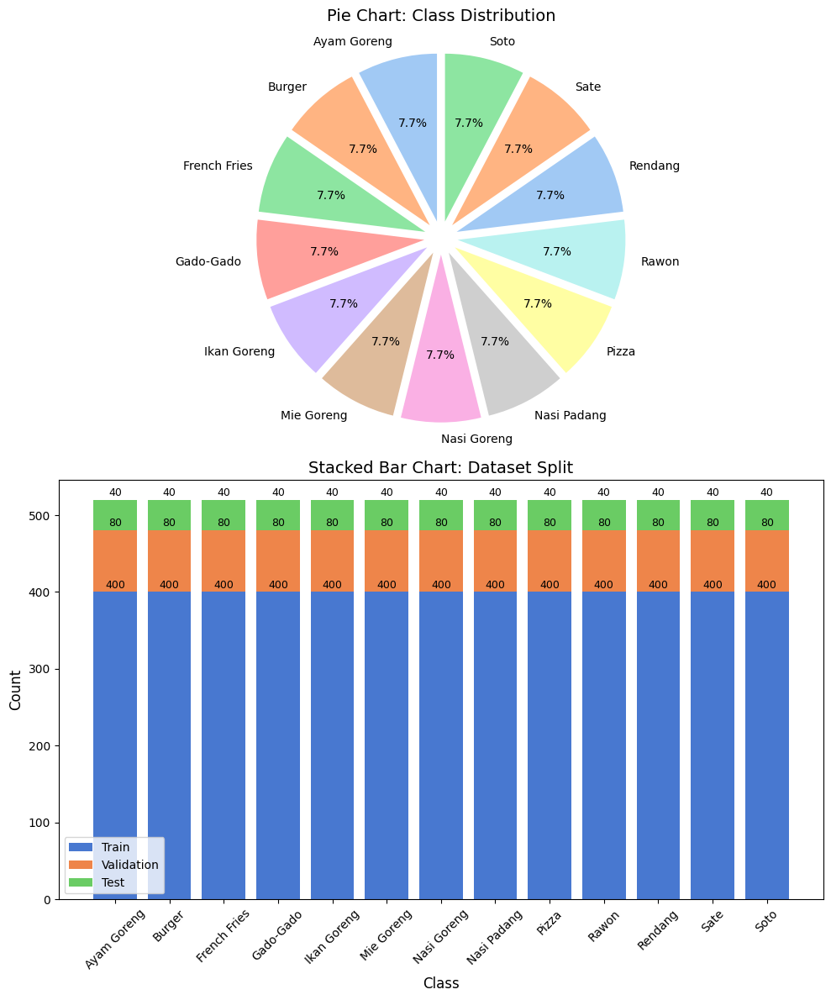

In [16]:
class_dis = [len(os.listdir(train_dir + name)) for name in class_names]
train_counts = class_dis
val_counts = [int(x * 0.2) for x in class_dis]  # Example validation counts
test_counts = [int(x * 0.1) for x in class_dis]  # Example test counts

# color
colors_pie = sns.color_palette("pastel", len(class_names))  
colors_stack = sns.color_palette("muted", 3) 
fig, axes = plt.subplots(2, 1, figsize=(10, 12))

# 1. Pie Chart
explode = [0.1 if count == max(class_dis) else 0 for count in class_dis]  # Highlight class terbesar
axes[0].pie(
    class_dis,
    labels=class_names,
    autopct='%1.1f%%',
    startangle=90,
    explode=explode,
    colors=colors_pie
)
axes[0].set_title("Pie Chart: Class Distribution", fontsize=14)

# 2. Stacked Bar Chart
x = np.arange(len(class_names))

bars1 = axes[1].bar(class_names, train_counts, color=colors_stack[0], label='Train')
bars2 = axes[1].bar(class_names, val_counts, bottom=train_counts, color=colors_stack[1], label='Validation')
bars3 = axes[1].bar(class_names, test_counts, 
                    bottom=np.array(train_counts) + np.array(val_counts), 
                    color=colors_stack[2], label='Test')

# add labels total 
for bars, counts in zip([bars1, bars2, bars3], [train_counts, val_counts, test_counts]):
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        axes[1].text(
            bar.get_x() + bar.get_width() / 2,  # Tengah bar
            bar.get_y() + height + 2,  # Di atas bar
            str(count),
            ha='center',
            va='bottom',
            fontsize=9
        )

# configure Stacked Bar Chart
axes[1].set_title("Stacked Bar Chart: Dataset Split", fontsize=14)
axes[1].set_xlabel("Class", fontsize=12)
axes[1].set_ylabel("Count", fontsize=12)
axes[1].legend()
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

In [17]:
def plot_images(images: np.ndarray, labels: np.ndarray, n_rows: int=1, n_cols: int=3, class_names=class_names, figsize=(25, 16), model=None):
    """
    Plots a grid of random images and their corresponding labels, with an optional prediction from a given model.

    Args:
        images (np.ndarray): Array of images to plot.
        labels (np.ndarray): Array of labels corresponding to the images.
        n_rows (int): Number of rows in the plot grid.
        n_cols (int): Number of columns in the plot grid.
        class_names (list): A list of strings mapping the integer labels to their corresponding class names. Default is None.
        figsize (tuple): A tuple specifying the size of the figure. Default is (25, 8).
        model (tf.keras.Model): A Keras model object used to make predictions on the images. Default is None.

    Returns:
        None
    """
    # Randomly shuffle the images and labels
    indices = np.arange(len(images))
    np.random.shuffle(indices)
    images = images[indices]
    labels = labels[indices]

    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i])
#         label = f"Label: {labels[i]}"
#         if class_names:
#             label += f" ({class_names[labels[i]]})"
#         title = label
        title = f"{class_names[labels[i]]}"
        if model:
            pred = model.predict(images[i][np.newaxis])
            pred_label = f"Prediction: {np.argmax(pred)}"
            pred_percentage = f" ({np.max(pred) * 100:.2f}%)"
            if class_names:
                pred_label += f" ({class_names[np.argmax(pred)]})"
            title += f"\n{pred_label} {pred_percentage}"
        ax.set_title(title)
        ax.axis('off')
    plt.show()

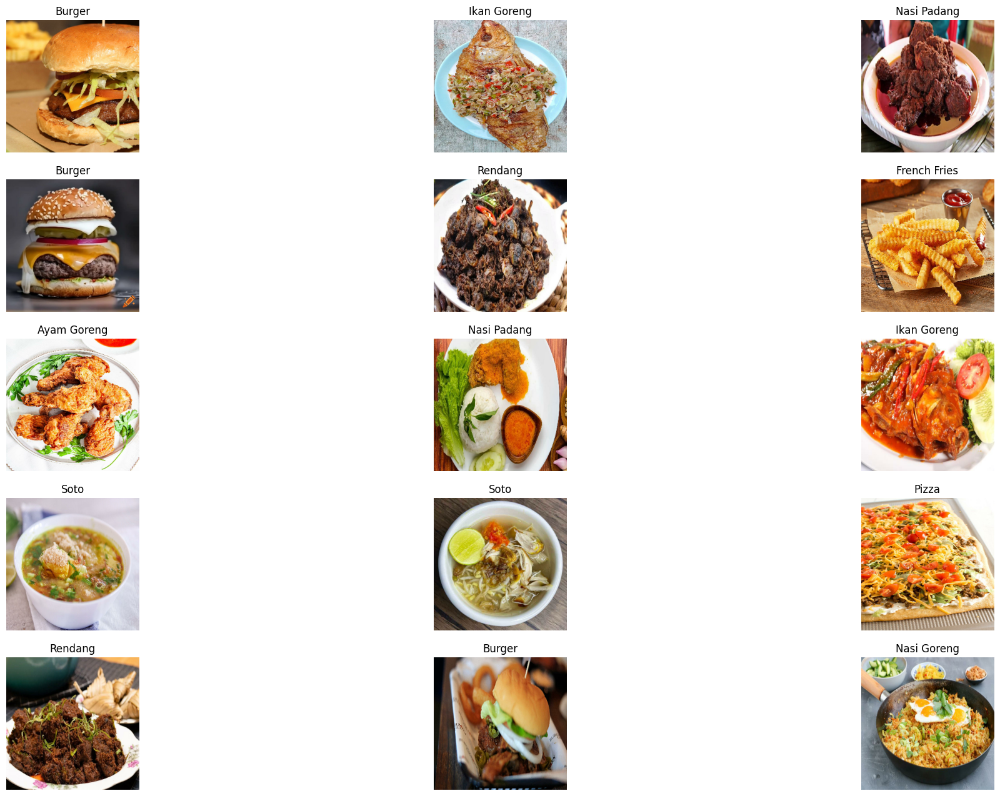

In [18]:
labels = y_train.flatten()

# Visualize Training Dataset
plot_images(images=X_train, labels=labels, n_rows=5)

In [19]:
def augment_images(images):
    # Randomly flip the images horizontally
    images = tf.image.random_flip_left_right(images)

    # Randomly flip the images vertically
    images = tf.image.random_flip_up_down(images)

    # Randomly rotate the images
    images = tf.image.rot90(images, k=tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))

    # Randomly adjust the brightness of the images
    images = tf.image.random_brightness(images, max_delta=0.2)

    # Randomly adjust the contrast of the images
    images = tf.image.random_contrast(images, lower=0.8, upper=1.2)

    # Randomly adjust the hue of the images
    images = tf.image.random_hue(images, max_delta=0.2)

    # Randomly adjust the saturation of the images
    images = tf.image.random_saturation(images, lower=0.8, upper=1.2)

    # Make sure the pixel values are still in the range [0, 1]
    images = tf.clip_by_value(images, 0.0, 1.0)

    return images

In [20]:
def create_dataset(X_data, y_data, buffer_size=1024, batch_size=BATCH_SIZE, augment=False):
    # Create a tf.data.Dataset for the data
    dataset = tf.data.Dataset.from_tensor_slices((X_data, y_data))

    if augment:
        # Shuffle and batch the data
        dataset = dataset.shuffle(buffer_size=buffer_size).batch(batch_size=batch_size)

        # Apply data augmentation to the images
        dataset = dataset.map(lambda x, y: (augment_images(x), y))

        # Repeat the dataset for multiple epochs
        dataset = dataset.repeat()

    else:
        dataset = dataset.batch(batch_size=BATCH_SIZE)

    # Prefetch the data for better performance
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

    return dataset

In [21]:
# create dataset with augmented images
train_dataset = create_dataset(X_train, y_train, buffer_size=1024, batch_size=BATCH_SIZE, augment=True)
val_dataset = create_dataset(X_valid, y_valid, buffer_size=1024, batch_size=BATCH_SIZE)

In [22]:
def plot_augmented_images(X_data, BATCH_SIZE, augment_images):
    # Randomly select a batch of images from X_train
    indices = np.random.choice(len(X_train), size=BATCH_SIZE, replace=False)
    batch = X_data[indices].copy() # A batch of images as a NumPy array or a TensorFlow tensor

    images = batch

    # Apply data augmentation to the images
    augmented_images = augment_images(images)

    # Plot the original and augmented images
    n_images = len(images)
    n_cols = 2
    n_rows = n_images
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows))
    for i in range(n_images):
        # Plot the original image
        axes[i, 0].imshow(images[i])
        axes[i, 0].set_title("Original Image")
        axes[i, 0].axis('off')

        # Plot the augmented image
        axes[i, 1].imshow(augmented_images[i])
        axes[i, 1].set_title("Augmented Image")
        axes[i, 1].axis('off')
    plt.show()

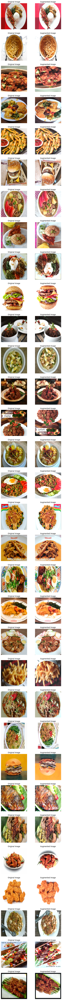

In [23]:
plot_augmented_images(X_train, BATCH_SIZE, augment_images)

In [24]:
# Delete the training and validation datasets to clean up memory
del X_train
del y_train
del X_valid
del y_valid

In [25]:
# Xception

xception = Xception(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), weights='imagenet', include_top=False)

xception.trainable = False

xception = Sequential([
    xception,
    GlobalAveragePooling2D(),
    Dropout(0.2),
    Dense(n_classes, activation='softmax')
], name='nvbite_xception_v1')

xception.compile(
    loss=LOSS,
    optimizer=Adam(learning_rate=LEARNING_RATE),
    metrics=METRICS
)

print("\nTraining Xception Model: ")
# steps_per_epoch = len(X_train)
STEPS_PER_EPOCH = 100
history = xception.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=EPOCHS,
    callbacks=[
        EarlyStopping(patience=3, restore_best_weights=True),
        ModelCheckpoint("XceptionBaseLine.keras", save_best_only=True)
    ],
    batch_size=BATCH_SIZE,
    steps_per_epoch=STEPS_PER_EPOCH
)

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

Training Xception Model: 
Epoch 1/30


I0000 00:00:1732480794.417693      80 service.cc:145] XLA service 0x7e0f6403b420 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732480794.417779      80 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1732480794.417787      80 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
2024-11-24 20:40:02.569010: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng3{k11=2} for conv (f32[32,128,147,147]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,128,147,147]{3,2,1,0}, f32[128,1,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, feature_group_count=128, custom_call_target="__cudnn$convForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-11-24 20:40:02.57287

100/100 ━━━━━━━━━━━━━━━━━━━━ 83s 528ms/step - accuracy: 0.4687 - loss: 1.8761 - val_accuracy: 0.8154 - val_loss: 0.8278
Epoch 2/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 53s 531ms/step - accuracy: 0.7902 - loss: 0.8307 - val_accuracy: 0.8369 - val_loss: 0.6224
Epoch 3/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 377ms/step - accuracy: 0.8289 - loss: 0.6503 - val_accuracy: 0.8385 - val_loss: 0.5717
Epoch 4/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 34s 345ms/step - accuracy: 0.8411 - loss: 0.5762 - val_accuracy: 0.8554 - val_loss: 0.5119
Epoch 5/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 33s 336ms/step - accuracy: 0.8424 - loss: 0.5522 - val_accuracy: 0.8585 - val_loss: 0.4885
Epoch 6/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 33s 335ms/step - accuracy: 0.8593 - loss: 0.4973 - val_accuracy: 0.8508 - val_loss: 0.4842
Epoch 7/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 33s 332ms/step - accuracy: 0.8645 - loss: 0.4666 - val_accuracy: 0.8569 - val_loss: 0.4750
Epoch 8/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 34s 337ms/step - accuracy: 0.8643 - loss: 0.4681 - val

In [26]:
input_shape = xception.layers[0].input_shape
input_shape

(None, 300, 300, 3)

In [27]:
test_loss, test_acc = xception.evaluate(X_test, y_test)
print("Loss    : {:.4}".format(test_loss))
print("Accuracy: {:.4}%".format(test_acc*100))

21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 256ms/step - accuracy: 0.9021 - loss: 0.3173
Loss    : 0.3278
Accuracy: 90.77%


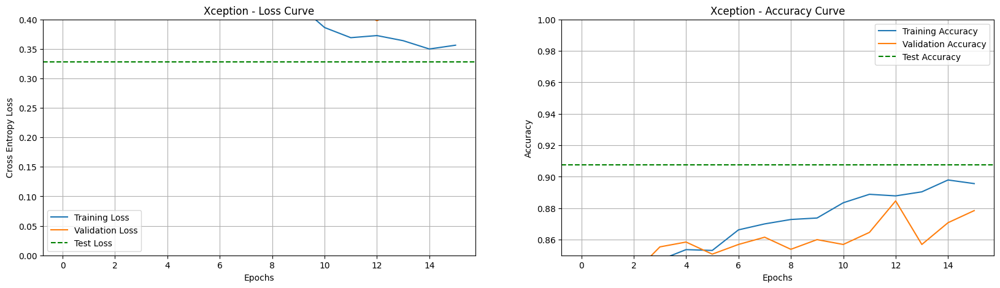

In [28]:
# Collect the history of the training run
history = pd.DataFrame(history.history)

# Create a figure to display the model's performance
plt.figure(figsize=(20, 5))

# Plot the loss curve in the first subplot
plt.subplot(1, 2, 1)
plt.title("Xception - Loss Curve")
plt.plot(history['loss'], label="Training Loss")
plt.plot(history['val_loss'], label="Validation Loss")

# Horizontal line to show the testing performance
plt.axhline(y=test_loss, label="Test Loss", linestyle='--', color='green')

# Set the x- and y-labels, and the x- and y-limits
plt.xlabel("Epochs")
plt.ylabel("Cross Entropy Loss")
plt.ylim([0, 0.4])

# Show the legend and grid
plt.legend()
plt.grid()

# Plot the accuracy curve in the second subplot
plt.subplot(1, 2, 2)
plt.title("Xception - Accuracy Curve")
plt.plot(history['accuracy'], label="Training Accuracy")
plt.plot(history['val_accuracy'], label="Validation Accuracy")

# Horizontal line to show the testing performance
plt.axhline(y=test_acc, label="Test Accuracy", linestyle='--', color='green')

# Set the x- and y-labels, and the x- and y-limits
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.ylim([0.85, 1])

# Show the legend and grid
plt.legend()
plt.grid()

# Display the plot
plt.show()

In [29]:
# Make predictions
baseline_pred = np.argmax(xception.predict(X_test, verbose=0), axis=-1)
# best_pred = np.argmax(mobile_net_model.predict(X_test, verbose=0), axis=-1)

# Evaluate prediction : Precision
baseline_pre = precision_score(y_test, baseline_pred, average='macro', zero_division=0)
# best_pre = precision_score(y_test, best_pred, average='macro')

# Evaluate prediction : Recall
baseline_recall = recall_score(y_test, baseline_pred, average='macro', zero_division=0)
# best_recall = recall_score(y_test, best_pred, average='macro')

# Evaluate prediction : F1 Score
baseline_f1 = f1_score(y_test, baseline_pred, average='macro', zero_division=0)
# best_f1 = f1_score(y_test, best_pred, average='macro')

print("{:20}".format("Baseline Performance"))
print("{:10} : {:.5}".format("Precision", baseline_pre))
print("{:10} : {:.5}".format("Recall", baseline_recall))
print("{:10} : {:.5}".format("F1 Score", baseline_f1))

Baseline Performance
Precision  : 0.91262
Recall     : 0.90769
F1 Score   : 0.90799


In [30]:
print(classification_report(y_test, baseline_pred, zero_division=0))

              precision    recall  f1-score   support

           0       0.93      0.78      0.85        50
           1       0.94      1.00      0.97        50
           2       0.92      0.98      0.95        50
           3       0.86      0.86      0.86        50
           4       0.92      0.88      0.90        50
           5       0.87      0.92      0.89        50
           6       0.96      0.92      0.94        50
           7       0.74      0.96      0.83        50
           8       1.00      0.98      0.99        50
           9       0.91      0.86      0.89        50
          10       0.93      0.86      0.90        50
          11       0.96      0.88      0.92        50
          12       0.92      0.92      0.92        50

    accuracy                           0.91       650
   macro avg       0.91      0.91      0.91       650
weighted avg       0.91      0.91      0.91       650



In [31]:
# Define class name
class_names = ['Ayam Goreng', 'Burger', 'French Fries', 'Gado-Gado', 'Ikan Goreng',
               'Mie Goreng', 'Nasi Goreng', 'Nasi Padang', 'Pizza', 'Rawon',
               'Rendang', 'Sate', 'Soto']
# Mapping category
category = {i: [class_name, class_name] for i, class_name in enumerate(class_names)}

def predict_all_classes(test_dir, model):
    accuracies = [] 
    class_labels = [] 
    
    for class_name in sorted(os.listdir(test_dir)):
        class_dir = os.path.join(test_dir, class_name)
        if not os.path.isdir(class_dir):  
            continue

        total_images = len(os.listdir(class_dir))
        correct_predictions = 0

        for img_file in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_file)
            
            # preprocess gambar
            img_ = image.load_img(img_path, target_size=(299, 299))
            img_array = image.img_to_array(img_)
            img_processed = np.expand_dims(img_array, axis=0)
            img_processed /= 255.0
            
            # prediction
            prediction = model.predict(img_processed)
            index = np.argmax(prediction)
            predicted_label = category[index][0]
            if predicted_label == class_name:
                correct_predictions += 1

        # calculate accuracy
        acc = correct_predictions / total_images
        accuracies.append(acc)
        class_labels.append(class_name)
        print(f"Class: {class_name}, Accuracy: {acc:.2f} ({correct_predictions}/{total_images})")
        cls()
    # Plot accuracy
    plt.figure(figsize=(10, 6))
    bars = plt.barh(class_labels, accuracies, color='skyblue')
    plt.xlabel('Accuracy')
    plt.ylabel('Class')
    plt.title('Accuracy per Class')
    plt.xlim(0, 1) 
    
    for bar, acc in zip(bars, accuracies):
        plt.text(bar.get_width() + 0.02, bar.get_y() + bar.get_height()/2, f"{acc:.2f}",
                 va='center', ha='left', fontsize=10)
    
    plt.tight_layout()
    plt.show()

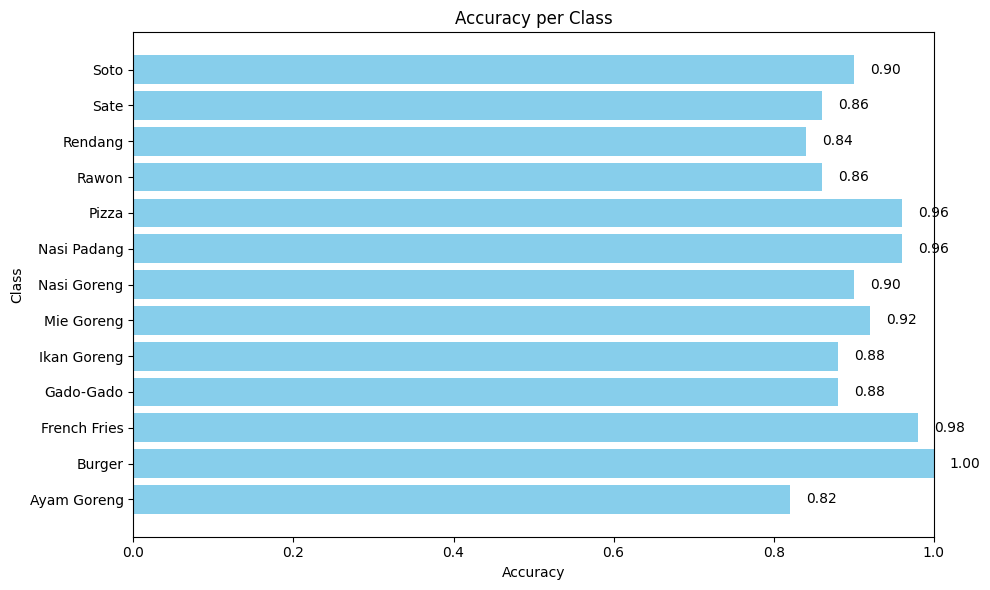

In [32]:
predict_all_classes('/kaggle/working/dataset/test', xception)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


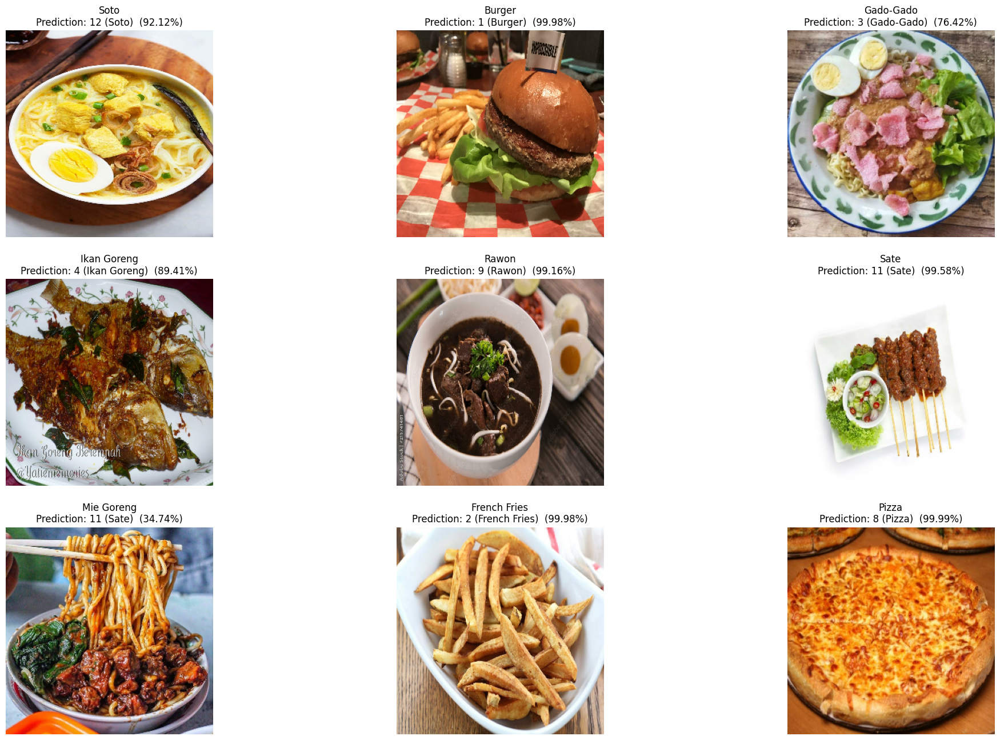

In [33]:
labels = y_test.flatten()
plot_images(images=X_test, labels=labels, model=xception, n_rows=3)